# Sample Integration and Comparative Analysis

This notebook demonstrates a comprehensive workflow for integrating and comparing spatial transcriptomics samples:
- Creating mock treated sample with batch effects
- Sample integration using Harmony
- **Cell type annotation with CellTypist**
- Per-cell-type differential expression analysis (DEGs)
- Per-cell-type gene set enrichment analysis (GSEA) with KEGG pathways
- Cell type proportion comparison between conditions
- Treated vs Untreated spatial visualization

**Author:** Generated for ST Course  
**Input Data:** adult_mouse_brain_ST4k.h5ad

## Workflow Overview:
1. Load Original Sample and Create Mock Treated Sample
2. Quality Control and Preprocessing
3. Sample Integration with Harmony
4. Cell Type Annotation with CellTypist
5. Differential Expression Analysis per Cell Type
6. Gene Set Enrichment Analysis (GSEA) per Cell Type
7. Cell Type Proportion Comparison
8. Spatial Visualization of Treatment Effects
9. Summary and Export

## 1. Setup and Configuration

In [1]:
# Install required packages
!pip install -q scanpy harmonypy gseapy celltypist leidenalg python-igraph scipy scikit-learn adjustText

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.1/45.1 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 30.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.3/605.3 kB 28.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 68.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 55.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.6/176.6 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.6/58.6 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.1/284.1 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 64.6 MB/s eta 0:00:00


In [2]:
# Core libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy import stats
from scipy.sparse import issparse, csr_matrix
from matplotlib.patches import Patch

# Single-cell and spatial analysis
import scanpy as sc
import anndata as ad

# Batch correction
import harmonypy as hm

# Cell type annotation
import celltypist
from celltypist import models

# Gene set enrichment
import gseapy as gp

# Configure settings
warnings.filterwarnings('ignore')
sc.settings.verbosity = 1
sc.settings.set_figure_params(dpi=100, facecolor='white', frameon=False)
sc.logging.print_header()

np.random.seed(42)

print(f"\nPackage versions:")
print(f"  Scanpy: {sc.__version__}")
print(f"  AnnData: {ad.__version__}")
print(f"  CellTypist: {celltypist.__version__}")
print(f"  GSEApy: {gp.__version__}")
print(f"  Harmonypy: {hm.__version__}")

/usr/local/lib/python3.12/dist-packages/celltypist/classifier.py:11: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  from scanpy import __version__ as scv



Package versions:
  Scanpy: 1.12
  AnnData: 0.12.10
  CellTypist: 1.7.1
  GSEApy: 1.1.11
  Harmonypy: 0.2.0


In [3]:
# Define consistent color scheme
COLORS = {
    'control': '#3A86FF',
    'treated': '#FF006E',
    'upregulated': '#E63946',
    'downregulated': '#457B9D',
    'neutral': '#B1B1B1',
    'dark_gray': '#4A4A4A'
}

# Matplotlib configuration
plt.rcParams.update({
    'figure.figsize': (10, 8),
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': False,
    'font.family': 'Arial',
    'font.size': 11,
    'axes.labelsize': 12,
    'axes.titlesize': 14,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'legend.frameon': False
})

print("Color scheme and plotting parameters configured")

Color scheme and plotting parameters configured


## 2. Load Original Sample and Create Mock Treated Sample

We load the original untreated sample and create a mock treated sample with:
- Modified spatial coordinates (simulating neighboring tissue slice)
- Altered gene expression for specific pathways (simulating treatment effect)
- Technical batch effects (simulating different experimental conditions)

In [4]:
!pip install gdown
import gdown

url = "https://drive.google.com/uc?id=1lRM-tR1MMbtgyKXLqRzV2YxokweiNUMz"
data_path = "adult_mouse_brain_ST4k.h5ad"
gdown.download(url, data_path, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1lRM-tR1MMbtgyKXLqRzV2YxokweiNUMz
To: /content/adult_mouse_brain_ST4k.h5ad
100%|██████████| 5.71M/5.71M [00:00<00:00, 103MB/s]


'adult_mouse_brain_ST4k.h5ad'

In [5]:
# Load original data
data_path = 'adult_mouse_brain_ST4k.h5ad'
adata_control = sc.read_h5ad(data_path)

print("ORIGINAL DATA LOADED")
print(f"Spots: {adata_control.n_obs:,}")
print(f"Genes: {adata_control.n_vars:,}")
print(f"\n{adata_control}")

adata_control.obs['condition'] = 'Control'
adata_control.obs['batch'] = 'batch1'
adata_control.obs['sample'] = 'control'

ORIGINAL DATA LOADED
Spots: 4,000
Genes: 20,062

AnnData object with n_obs × n_vars = 4000 × 20062
    obs: 'n_genes_by_counts'
    var: 'Symbol'
    obsm: 'spatial'


In [6]:
# Create mock treated sample
print("CREATING MOCK TREATED SAMPLE")

adata_treated = adata_control.copy()

# 1. Modify spatial coordinates (simulate neighboring slice)
if 'spatial' in adata_treated.obsm:
    coords = adata_treated.obsm['spatial'].copy()
    coords[:, 0] += 50
    coords[:, 1] += 30
    jitter = np.random.normal(0, 2, coords[:, :2].shape)
    coords[:, :2] += jitter
    adata_treated.obsm['spatial'] = coords
    print("  Coordinates shifted with jitter")

# 2. Simulate treatment effects on gene expression
n_genes = adata_treated.n_vars
n_affected = int(n_genes * 0.10)
affected_genes_idx = np.random.choice(n_genes, n_affected, replace=False)
n_up = n_affected // 2
upregulated_idx = affected_genes_idx[:n_up]
downregulated_idx = affected_genes_idx[n_up:]

if issparse(adata_treated.X):
    X_treated = adata_treated.X.toarray()
else:
    X_treated = adata_treated.X.copy()

for idx in upregulated_idx:
    X_treated[:, idx] *= np.random.uniform(1.5, 3.0)
for idx in downregulated_idx:
    X_treated[:, idx] *= np.random.uniform(0.3, 0.7)

print(f"  Modified expression for {n_affected} genes ({len(upregulated_idx)} up, {len(downregulated_idx)} down)")

# 3. Add batch effects
depth_factor = np.random.uniform(0.85, 1.15)
X_treated *= depth_factor

n_batch_genes = int(n_genes * 0.30)
batch_genes_idx = np.random.choice(n_genes, n_batch_genes, replace=False)
for idx in batch_genes_idx:
    X_treated[:, idx] *= np.random.uniform(0.7, 1.3)

noise = np.random.normal(1.0, 0.05, X_treated.shape)
X_treated *= noise
X_treated = np.maximum(X_treated, 0)

adata_treated.X = csr_matrix(X_treated)

adata_treated.var['is_affected'] = False
adata_treated.var.iloc[affected_genes_idx, adata_treated.var.columns.get_loc('is_affected')] = True
adata_treated.var['true_effect'] = 'none'
adata_treated.var.iloc[upregulated_idx, adata_treated.var.columns.get_loc('true_effect')] = 'up'
adata_treated.var.iloc[downregulated_idx, adata_treated.var.columns.get_loc('true_effect')] = 'down'

adata_treated.obs['condition'] = 'Treated'
adata_treated.obs['batch'] = 'batch2'
adata_treated.obs['sample'] = 'treated'
adata_treated.obs_names = [name + '_treated' for name in adata_treated.obs_names]

print(f"  Applied batch effects (depth factor: {depth_factor:.3f}, {n_batch_genes} batch genes)")
print(f"\nMock treated sample: {adata_treated.n_obs:,} spots, {adata_treated.n_vars:,} genes")

CREATING MOCK TREATED SAMPLE
  Coordinates shifted with jitter
  Modified expression for 2006 genes (1003 up, 1003 down)
  Applied batch effects (depth factor: 1.038, 6018 batch genes)

Mock treated sample: 4,000 spots, 20,062 genes


In [7]:
# Save the treated sample
treated_path = 'adult_mouse_brain_ST4k_treated.h5ad'
adata_treated.write(treated_path)
print(f"Treated sample saved to: {treated_path} ({os.path.getsize(treated_path) / (1024**2):.1f} MB)")

Treated sample saved to: adult_mouse_brain_ST4k_treated.h5ad (15.5 MB)


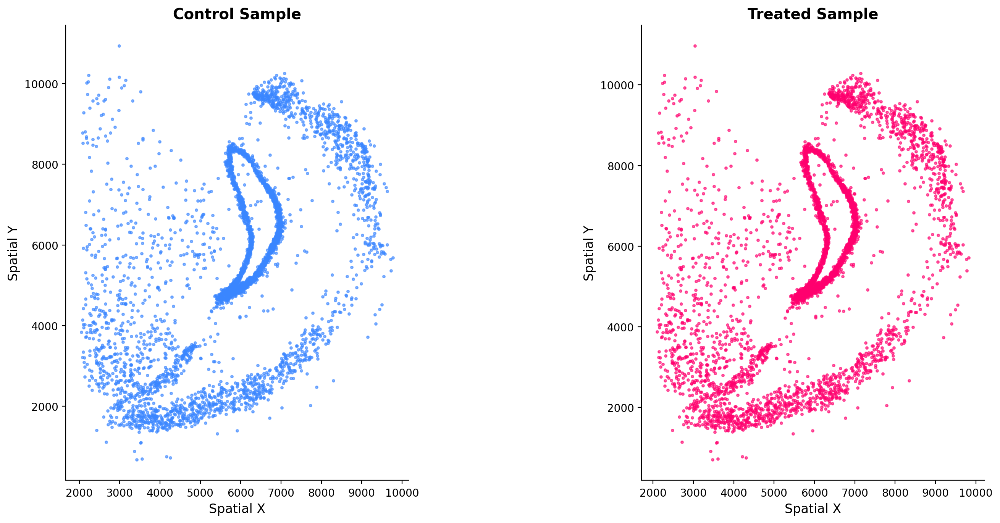

In [8]:
# Visualize both samples spatially
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

for ax, adata, label, color in [
    (axes[0], adata_control, 'Control', COLORS['control']),
    (axes[1], adata_treated, 'Treated', COLORS['treated'])
]:
    coords = adata.obsm['spatial']
    ax.scatter(coords[:, 0], coords[:, 1], c=color, s=5, alpha=0.6)
    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')
    ax.set_title(f'{label} Sample', fontweight='bold')
    ax.set_aspect('equal')

plt.tight_layout()
plt.show()

## 3. Quality Control, Preprocessing, and Integration

In [9]:
# Concatenate both samples
adata_combined = ad.concat([adata_control, adata_treated],
                           join='outer',
                           label='sample_id',
                           keys=['control', 'treated'])

adata_combined.obs['condition'] = adata_combined.obs['sample'].astype(str).map(
    {'control': 'Control', 'treated': 'Treated'})
adata_combined.obs['batch'] = adata_combined.obs['sample'].astype(str).map(
    {'control': 'batch1', 'treated': 'batch2'})

print(f"Combined: {adata_combined.n_obs:,} spots, {adata_combined.n_vars:,} genes")
print(adata_combined.obs['condition'].value_counts())

Combined: 8,000 spots, 20,062 genes
condition
Control    4000
Treated    4000
Name: count, dtype: int64


In [10]:
# Preprocessing
adata_combined.var['mt'] = adata_combined.var_names.str.startswith('mt-') | \
                           adata_combined.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata_combined, qc_vars=['mt'], percent_top=None,
                           log1p=False, inplace=True)

sc.pp.filter_cells(adata_combined, min_genes=200)
sc.pp.filter_genes(adata_combined, min_cells=3)

# Store raw counts
adata_combined.layers['counts'] = adata_combined.X.copy()

# Normalize and log transform
sc.pp.normalize_total(adata_combined, target_sum=1e4)
sc.pp.log1p(adata_combined)

# Store normalized data as raw
adata_combined.raw = adata_combined.copy()

# HVGs
sc.pp.highly_variable_genes(adata_combined, n_top_genes=2000,
                            flavor='seurat', batch_key='batch')

print(f"After filtering: {adata_combined.n_obs:,} spots, {adata_combined.n_vars:,} genes")
print(f"Highly variable genes: {adata_combined.var['highly_variable'].sum():,}")

After filtering: 7,724 spots, 15,444 genes
Highly variable genes: 2,000


In [11]:
# PCA
sc.tl.pca(adata_combined, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30)
sc.tl.umap(adata_combined, min_dist=0.3)
print("PCA and UMAP computed (before integration)")

PCA and UMAP computed (before integration)


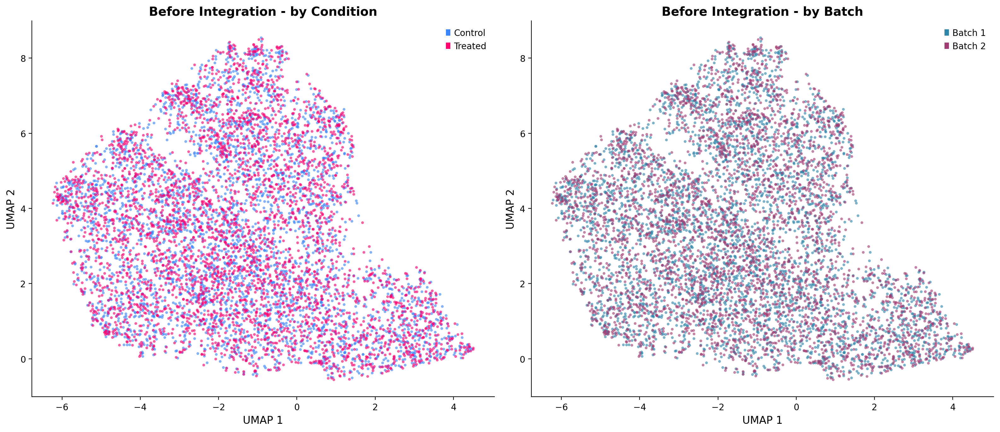

In [12]:
# Visualize before integration
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

condition_colors = {'Control': COLORS['control'], 'Treated': COLORS['treated']}
colors_cond = [condition_colors[c] for c in adata_combined.obs['condition']]

axes[0].scatter(adata_combined.obsm['X_umap'][:, 0],
               adata_combined.obsm['X_umap'][:, 1],
               c=colors_cond, s=5, alpha=0.5)
axes[0].set_xlabel('UMAP 1')
axes[0].set_ylabel('UMAP 2')
axes[0].set_title('Before Integration - by Condition', fontweight='bold')
axes[0].legend(handles=[Patch(facecolor=COLORS['control'], label='Control'),
                        Patch(facecolor=COLORS['treated'], label='Treated')])

batch_colors = {'batch1': '#2E86AB', 'batch2': '#A23B72'}
colors_batch = [batch_colors[b] for b in adata_combined.obs['batch']]

axes[1].scatter(adata_combined.obsm['X_umap'][:, 0],
               adata_combined.obsm['X_umap'][:, 1],
               c=colors_batch, s=5, alpha=0.5)
axes[1].set_xlabel('UMAP 1')
axes[1].set_ylabel('UMAP 2')
axes[1].set_title('Before Integration - by Batch', fontweight='bold')
axes[1].legend(handles=[Patch(facecolor='#2E86AB', label='Batch 1'),
                        Patch(facecolor='#A23B72', label='Batch 2')])

plt.tight_layout()
plt.show()

### Harmony Integration

Harmony removes batch effects in PCA space while preserving biological variation.

In [14]:
import numpy as np
import harmonypy as hm

# Run Harmony
pca_coords = adata_combined.obsm['X_pca'].copy()
meta_data = adata_combined.obs[['batch']].copy()

harmony_out = hm.run_harmony(
    pca_coords,
    meta_data,
    'batch',
    max_iter_harmony=20,
    verbose=True
)

# Extract corrected embeddings
Z = harmony_out.Z_corr

# Convert to numpy safely
try:
    import torch
    if isinstance(Z, torch.Tensor):
        Z = Z.detach().cpu().numpy()
except ImportError:
    pass

Z = np.asarray(Z)

# -------------------------------------------------
# FIX: Ensure correct orientation
# Final shape must be (n_cells, n_pcs)
# -------------------------------------------------

n_cells = adata_combined.n_obs

if Z.shape[0] == n_cells:
    X_pca_harmony = Z
elif Z.shape[1] == n_cells:
    X_pca_harmony = Z.T
else:
    raise ValueError(
        f"Harmony output shape {Z.shape} does not match number of cells {n_cells}"
    )

# Store corrected PCs
adata_combined.obsm['X_pca_harmony'] = X_pca_harmony

print("Harmony corrected PCs shape:", X_pca_harmony.shape)

2026-02-21 21:49:49,743 - harmonypy - INFO - Running Harmony (PyTorch on cpu)
INFO:harmonypy:Running Harmony (PyTorch on cpu)
2026-02-21 21:49:49,752 - harmonypy - INFO -   Parameters:
INFO:harmonypy:  Parameters:
2026-02-21 21:49:49,762 - harmonypy - INFO -     max_iter_harmony: 20
INFO:harmonypy:    max_iter_harmony: 20
2026-02-21 21:49:49,767 - harmonypy - INFO -     max_iter_kmeans: 20
INFO:harmonypy:    max_iter_kmeans: 20
2026-02-21 21:49:49,774 - harmonypy - INFO -     epsilon_cluster: 1e-05
INFO:harmonypy:    epsilon_cluster: 1e-05
2026-02-21 21:49:49,783 - harmonypy - INFO -     epsilon_harmony: 0.0001
INFO:harmonypy:    epsilon_harmony: 0.0001
2026-02-21 21:49:49,792 - harmonypy - INFO -     nclust: 100
INFO:harmonypy:    nclust: 100
2026-02-21 21:49:49,800 - harmonypy - INFO -     block_size: 0.05
INFO:harmonypy:    block_size: 0.05
2026-02-21 21:49:49,809 - harmonypy - INFO -     lamb: [1. 1.]
INFO:harmonypy:    lamb: [1. 1.]
2026-02-21 21:49:49,815 - harmonypy - INFO -    

Harmony corrected PCs shape: (7724, 50)


In [15]:
# Recompute neighbors and UMAP with Harmony PCs
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30, use_rep='X_pca_harmony')
sc.tl.umap(adata_combined, min_dist=0.3)
adata_combined.obsm['X_umap_harmony'] = adata_combined.obsm['X_umap'].copy()
print("Post-integration UMAP computed")

Post-integration UMAP computed


In [16]:
# Leiden clustering on integrated data
sc.tl.leiden(adata_combined, resolution=0.5, key_added='leiden_harmony')
print(f"Clusters: {adata_combined.obs['leiden_harmony'].nunique()}")
print(adata_combined.obs['leiden_harmony'].value_counts().sort_index())

Clusters: 5
leiden_harmony
0    1942
1    1826
2    1565
3    1317
4    1074
Name: count, dtype: int64


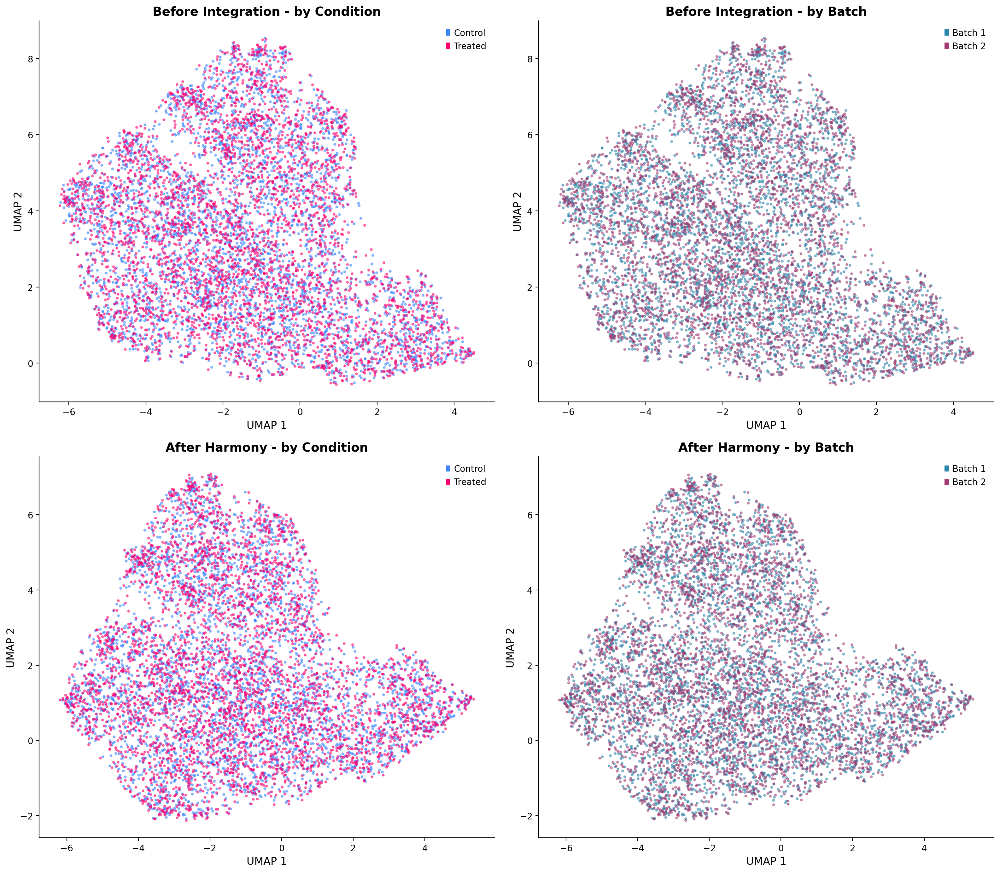

In [17]:
# Before/After integration comparison
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

condition_colors_arr = [condition_colors[c] for c in adata_combined.obs['condition']]
batch_colors_arr = [batch_colors[b] for b in adata_combined.obs['batch']]

# Before integration
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30, use_rep='X_pca')
sc.tl.umap(adata_combined, min_dist=0.3)
umap_before = adata_combined.obsm['X_umap'].copy()

for ax, colors, title, legend in [
    (axes[0, 0], condition_colors_arr, 'Before Integration - by Condition',
     [Patch(facecolor=COLORS['control'], label='Control'),
      Patch(facecolor=COLORS['treated'], label='Treated')]),
    (axes[0, 1], batch_colors_arr, 'Before Integration - by Batch',
     [Patch(facecolor='#2E86AB', label='Batch 1'),
      Patch(facecolor='#A23B72', label='Batch 2')])
]:
    ax.scatter(umap_before[:, 0], umap_before[:, 1], c=colors, s=5, alpha=0.5)
    ax.set_xlabel('UMAP 1'); ax.set_ylabel('UMAP 2')
    ax.set_title(title, fontweight='bold')
    ax.legend(handles=legend)

# After integration
umap_after = adata_combined.obsm['X_umap_harmony']

for ax, colors, title, legend in [
    (axes[1, 0], condition_colors_arr, 'After Harmony - by Condition',
     [Patch(facecolor=COLORS['control'], label='Control'),
      Patch(facecolor=COLORS['treated'], label='Treated')]),
    (axes[1, 1], batch_colors_arr, 'After Harmony - by Batch',
     [Patch(facecolor='#2E86AB', label='Batch 1'),
      Patch(facecolor='#A23B72', label='Batch 2')])
]:
    ax.scatter(umap_after[:, 0], umap_after[:, 1], c=colors, s=5, alpha=0.5)
    ax.set_xlabel('UMAP 1'); ax.set_ylabel('UMAP 2')
    ax.set_title(title, fontweight='bold')
    ax.legend(handles=legend)

plt.tight_layout()
plt.show()

## 4. Cell Type Annotation with CellTypist

We use CellTypist with the `Mouse_Whole_Brain.pkl` model (334 cell types from the Allen Brain Atlas) to annotate cell types in the integrated dataset. Majority voting refines predictions using local neighborhood information.

In [18]:
# Restore Harmony-based neighbors for CellTypist majority voting
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30, use_rep='X_pca_harmony')
adata_combined.obsm['X_umap'] = adata_combined.obsm['X_umap_harmony'].copy()

# Download model if needed and run annotation
models.download_models(model='Mouse_Whole_Brain.pkl', force_update=False)

predictions = celltypist.annotate(
    adata_combined,
    model='Mouse_Whole_Brain.pkl',
    majority_voting=True
)

adata_combined = predictions.to_adata()

print(f"Cell types annotated: {adata_combined.obs['majority_voting'].nunique()}")
print(f"\nTop 15 cell types:")
print(adata_combined.obs['majority_voting'].value_counts().head(15))

Cell types annotated: 8

Top 15 cell types:
majority_voting
319 Astro-TE NN              3478
332 SMC NN                   2902
318 Astro-NT NN               834
037 DG Glut                   388
009 L2/3 IT PIR-ENTl Glut      58
045 OB-STR-CTX Inh IMN         36
330 VLMC NN                    18
331 Peri NN                    10
Name: count, dtype: int64


In [19]:
# Simplify cell type labels for visualization
# Keep top N cell types, group the rest as 'Other'
top_n = 12
ct_counts = adata_combined.obs['majority_voting'].value_counts()
top_types = ct_counts.head(top_n).index.tolist()

adata_combined.obs['cell_type'] = adata_combined.obs['majority_voting'].apply(
    lambda x: x if x in top_types else 'Other'
)

print(f"Simplified to {adata_combined.obs['cell_type'].nunique()} categories (top {top_n} + Other)")
print(adata_combined.obs['cell_type'].value_counts())

Simplified to 8 categories (top 12 + Other)
cell_type
319 Astro-TE NN              3478
332 SMC NN                   2902
318 Astro-NT NN               834
037 DG Glut                   388
009 L2/3 IT PIR-ENTl Glut      58
045 OB-STR-CTX Inh IMN         36
330 VLMC NN                    18
331 Peri NN                    10
Name: count, dtype: int64


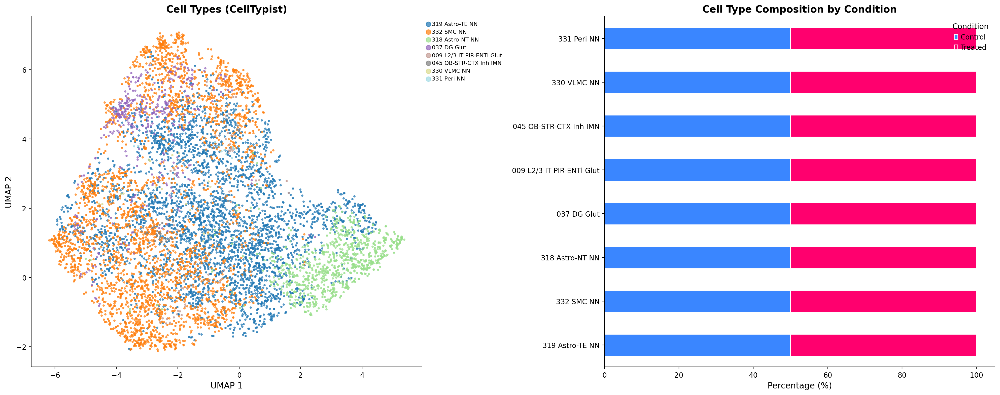

In [20]:
# UMAP colored by cell type
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Cell type UMAP
cell_types_unique = adata_combined.obs['cell_type'].value_counts().index.tolist()
n_types = len(cell_types_unique)
cmap = plt.cm.tab20(np.linspace(0, 1, max(n_types, 2)))
ct_color_map = {ct: cmap[i] for i, ct in enumerate(cell_types_unique)}

umap = adata_combined.obsm['X_umap_harmony']
for ct in cell_types_unique:
    mask = adata_combined.obs['cell_type'] == ct
    axes[0].scatter(umap[mask, 0], umap[mask, 1],
                   c=[ct_color_map[ct]], label=ct, s=5, alpha=0.7)

axes[0].set_xlabel('UMAP 1')
axes[0].set_ylabel('UMAP 2')
axes[0].set_title('Cell Types (CellTypist)', fontweight='bold')
axes[0].legend(markerscale=3, fontsize=8, loc='upper left', bbox_to_anchor=(1, 1))

# Cell type by condition
ct_cond = pd.crosstab(adata_combined.obs['cell_type'], adata_combined.obs['condition'],
                       normalize='index') * 100
ct_cond = ct_cond.loc[cell_types_unique]

ct_cond[['Control', 'Treated']].plot(
    kind='barh', stacked=True, ax=axes[1],
    color=[COLORS['control'], COLORS['treated']], edgecolor='white', linewidth=1)
axes[1].set_xlabel('Percentage (%)')
axes[1].set_ylabel('')
axes[1].set_title('Cell Type Composition by Condition', fontweight='bold')
axes[1].legend(title='Condition')

plt.tight_layout()
plt.show()

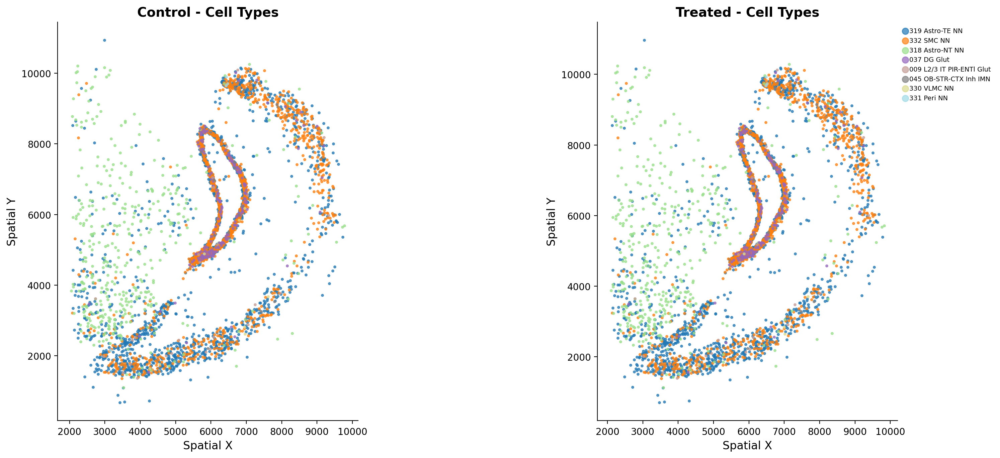

In [21]:
# Spatial visualization of cell types
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

for ax, cond, title in [(axes[0], 'Control', 'Control - Cell Types'),
                         (axes[1], 'Treated', 'Treated - Cell Types')]:
    mask = adata_combined.obs['condition'] == cond
    coords = adata_combined.obsm['spatial'][mask]
    ct_vals = adata_combined.obs.loc[mask, 'cell_type']

    for ct in cell_types_unique:
        ct_mask = ct_vals == ct
        if ct_mask.sum() > 0:
            ax.scatter(coords[ct_mask, 0], coords[ct_mask, 1],
                      c=[ct_color_map[ct]], label=ct, s=5, alpha=0.7)

    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')
    ax.set_title(title, fontweight='bold')
    ax.set_aspect('equal')

axes[1].legend(markerscale=3, fontsize=7, loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

## 5. Differential Expression Analysis per Cell Type

We perform Treated vs Control DE analysis within each cell type using Wilcoxon rank-sum test. The Control sample is used as reference.

In [22]:
# Differential expression per cell type
pval_threshold = 0.05
logfc_threshold = 0.5
min_cells = 30  # minimum cells per condition per cell type

all_deg_results = {}
deg_summary = []

# Exclude 'Other' from DE analysis
analysis_types = [ct for ct in cell_types_unique if ct != 'Other']

for ct in analysis_types:
    mask = adata_combined.obs['cell_type'] == ct
    adata_sub = adata_combined[mask].copy()

    # Check minimum cells per condition
    counts_per_cond = adata_sub.obs['condition'].value_counts()
    if counts_per_cond.min() < min_cells:
        print(f"  Skipping {ct}: too few cells ({counts_per_cond.min()} < {min_cells})")
        continue

    sc.tl.rank_genes_groups(
        adata_sub,
        groupby='condition',
        groups=['Treated'],
        reference='Control',
        method='wilcoxon',
        use_raw=True,
        key_added='de_condition'
    )

    df = sc.get.rank_genes_groups_df(adata_sub, group='Treated', key='de_condition')
    df['cell_type'] = ct
    df['-log10_pval'] = -np.log10(df['pvals_adj'] + 1e-300)

    df['regulation'] = 'Not significant'
    df.loc[(df['pvals_adj'] < pval_threshold) & (df['logfoldchanges'] > logfc_threshold), 'regulation'] = 'Upregulated'
    df.loc[(df['pvals_adj'] < pval_threshold) & (df['logfoldchanges'] < -logfc_threshold), 'regulation'] = 'Downregulated'

    n_up = (df['regulation'] == 'Upregulated').sum()
    n_down = (df['regulation'] == 'Downregulated').sum()

    all_deg_results[ct] = df
    deg_summary.append({'cell_type': ct, 'n_up': n_up, 'n_down': n_down,
                        'n_total_deg': n_up + n_down,
                        'n_cells': adata_sub.n_obs})

    print(f"  {ct}: {n_up} up, {n_down} down ({adata_sub.n_obs} cells)")

deg_summary_df = pd.DataFrame(deg_summary).sort_values('n_total_deg', ascending=False)
print(f"\nDE analysis complete for {len(all_deg_results)} cell types")

  319 Astro-TE NN: 1 up, 2 down (3478 cells)
  332 SMC NN: 1 up, 2 down (2902 cells)
  318 Astro-NT NN: 0 up, 1 down (834 cells)
  037 DG Glut: 1 up, 0 down (388 cells)
  Skipping 009 L2/3 IT PIR-ENTl Glut: too few cells (29 < 30)
  Skipping 045 OB-STR-CTX Inh IMN: too few cells (18 < 30)
  Skipping 330 VLMC NN: too few cells (9 < 30)
  Skipping 331 Peri NN: too few cells (5 < 30)

DE analysis complete for 4 cell types


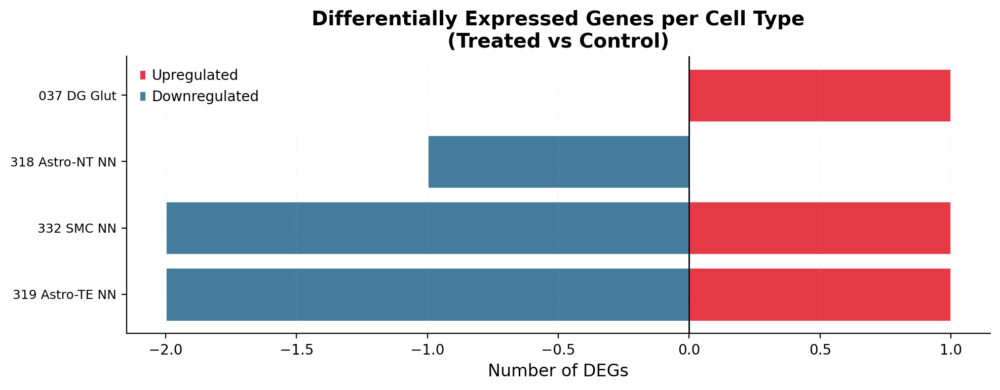

In [23]:
# DEG summary heatmap
fig, ax = plt.subplots(figsize=(10, max(4, len(deg_summary_df) * 0.5)))

summary_plot = deg_summary_df.set_index('cell_type')[['n_up', 'n_down']].copy()
summary_plot.columns = ['Upregulated', 'Downregulated']
summary_plot['Downregulated'] = -summary_plot['Downregulated']  # negative for visualization

y_pos = range(len(summary_plot))
ax.barh(y_pos, summary_plot['Upregulated'], color=COLORS['upregulated'],
        edgecolor='white', linewidth=1, label='Upregulated')
ax.barh(y_pos, summary_plot['Downregulated'], color=COLORS['downregulated'],
        edgecolor='white', linewidth=1, label='Downregulated')

ax.set_yticks(y_pos)
ax.set_yticklabels(summary_plot.index, fontsize=9)
ax.set_xlabel('Number of DEGs')
ax.set_title('Differentially Expressed Genes per Cell Type\n(Treated vs Control)', fontweight='bold')
ax.axvline(x=0, color='black', linewidth=1)
ax.legend()
ax.grid(True, alpha=0.2, axis='x', linestyle=':')

plt.tight_layout()
plt.show()

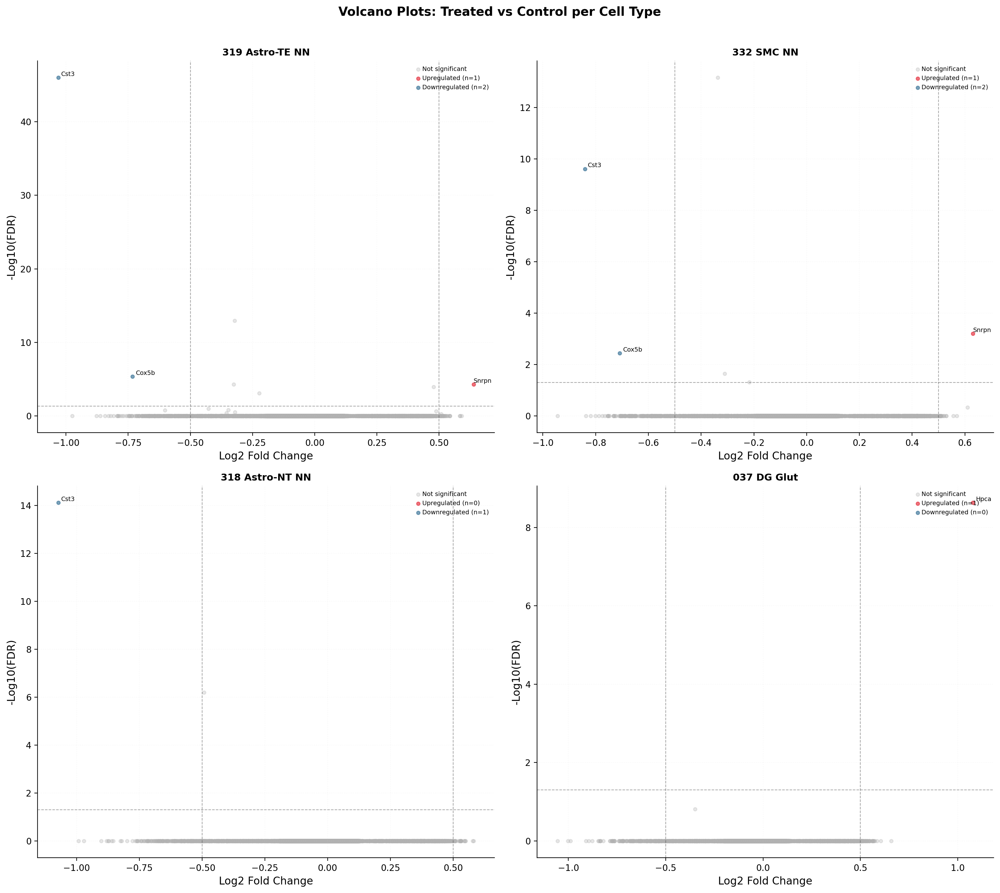

In [24]:
# Volcano plots for top cell types (by total DEGs)
from adjustText import adjust_text

top_ct_for_volcano = deg_summary_df.head(4)['cell_type'].tolist()
n_panels = len(top_ct_for_volcano)

if n_panels > 0:
    ncols = min(n_panels, 2)
    nrows = (n_panels + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(8 * ncols, 7 * nrows))
    if n_panels == 1:
        axes = np.array([axes])
    axes = np.atleast_2d(axes)

    for i, ct in enumerate(top_ct_for_volcano):
        r, c = divmod(i, ncols)
        ax = axes[r, c]
        df = all_deg_results[ct]

        for reg, color, alpha in [
            ('Not significant', COLORS['neutral'], 0.3),
            ('Upregulated', COLORS['upregulated'], 0.7),
            ('Downregulated', COLORS['downregulated'], 0.7)
        ]:
            sub = df[df['regulation'] == reg]
            n = len(sub)
            label = f'{reg} (n={n})' if reg != 'Not significant' else reg
            ax.scatter(sub['logfoldchanges'], sub['-log10_pval'],
                      c=color, s=15, alpha=alpha, label=label)

        ax.axhline(y=-np.log10(pval_threshold), color=COLORS['dark_gray'],
                  linestyle='--', linewidth=0.8, alpha=0.5)
        ax.axvline(x=logfc_threshold, color=COLORS['dark_gray'],
                  linestyle='--', linewidth=0.8, alpha=0.5)
        ax.axvline(x=-logfc_threshold, color=COLORS['dark_gray'],
                  linestyle='--', linewidth=0.8, alpha=0.5)

        # Label top genes
        top_genes = pd.concat([
            df[df['regulation'] == 'Upregulated'].nlargest(3, 'logfoldchanges'),
            df[df['regulation'] == 'Downregulated'].nsmallest(3, 'logfoldchanges')
        ])
        if len(top_genes) > 0:
            texts = [ax.text(row['logfoldchanges'], row['-log10_pval'],
                           row['names'], fontsize=7)
                    for _, row in top_genes.iterrows()]
            adjust_text(texts, ax=ax, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))

        ax.set_xlabel('Log2 Fold Change')
        ax.set_ylabel('-Log10(FDR)')
        ax.set_title(ct, fontweight='bold', fontsize=11)
        ax.legend(fontsize=7, loc='upper right')
        ax.grid(True, alpha=0.15, linestyle=':')

    # Hide unused axes
    for i in range(n_panels, nrows * ncols):
        r, c = divmod(i, ncols)
        axes[r, c].set_visible(False)

    fig.suptitle('Volcano Plots: Treated vs Control per Cell Type', fontweight='bold', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

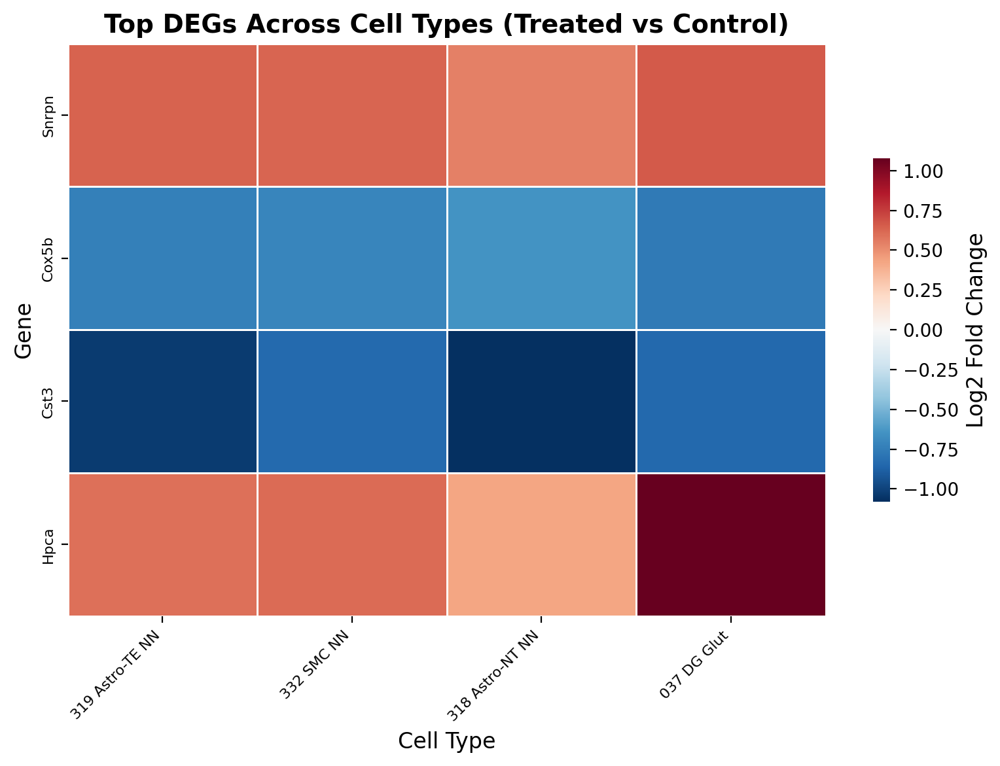

In [25]:
# Cross-cell-type DEG heatmap: top shared DEGs
# Collect top DEGs across cell types
top_genes_per_ct = []
for ct, df in all_deg_results.items():
    sig = df[df['regulation'] != 'Not significant']
    top = sig.nlargest(5, 'logfoldchanges')['names'].tolist() + \
          sig.nsmallest(5, 'logfoldchanges')['names'].tolist()
    top_genes_per_ct.extend(top)

# Get unique top genes
unique_top_genes = list(dict.fromkeys(top_genes_per_ct))[:30]

if len(unique_top_genes) > 0 and len(all_deg_results) > 1:
    # Build logFC matrix
    logfc_matrix = pd.DataFrame(index=unique_top_genes)
    for ct, df in all_deg_results.items():
        df_idx = df.set_index('names')
        logfc_matrix[ct] = df_idx.reindex(unique_top_genes)['logfoldchanges']

    logfc_matrix = logfc_matrix.dropna(how='all')
    logfc_matrix = logfc_matrix.fillna(0)

    fig, ax = plt.subplots(figsize=(max(8, len(all_deg_results) * 1.2),
                                     max(6, len(logfc_matrix) * 0.35)))

    vmax = np.abs(logfc_matrix.values).max()
    sns.heatmap(logfc_matrix, cmap='RdBu_r', center=0, vmin=-vmax, vmax=vmax,
                ax=ax, linewidths=0.5, linecolor='white',
                cbar_kws={'label': 'Log2 Fold Change', 'shrink': 0.6})

    ax.set_title('Top DEGs Across Cell Types (Treated vs Control)', fontweight='bold')
    ax.set_xlabel('Cell Type')
    ax.set_ylabel('Gene')
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(fontsize=8)

    plt.tight_layout()
    plt.show()

## 6. Gene Set Enrichment Analysis (GSEA) per Cell Type

GSEA with KEGG pathways identifies biological processes affected by treatment within each cell type.

In [26]:
# GSEA per cell type
all_gsea_results = {}

for ct, df in all_deg_results.items():
    gene_list = df.set_index('names')['logfoldchanges'].sort_values(ascending=False)
    gene_list = gene_list[~gene_list.index.duplicated(keep='first')]

    try:
        gsea_res = gp.prerank(
            rnk=gene_list,
            gene_sets='KEGG_2021_Mouse',
            processes=1,
            permutation_num=100,
            outdir=None,
            format='png',
            seed=42,
            verbose=False
        )

        gsea_df = gsea_res.res2d.copy()
        gsea_df['cell_type'] = ct
        all_gsea_results[ct] = gsea_df

        n_sig = (gsea_df['FDR q-val'] < 0.25).sum()
        print(f"  {ct}: {len(gsea_df)} pathways tested, {n_sig} significant (FDR < 0.25)")

    except Exception as e:
        print(f"  {ct}: GSEA failed - {e}")

print(f"\nGSEA complete for {len(all_gsea_results)} cell types")

2026-02-21 21:51:42,147 [WARNING] Duplicated values found in preranked stats: 2.91% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-02-21 21:51:42,433 [ERROR] No supported gene_sets: KEGG_2021_Mouse
2026-02-21 21:51:42,448 [WARNING] Duplicated values found in preranked stats: 6.70% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


  319 Astro-TE NN: GSEA failed - Error parsing gmt parameter for gene sets


2026-02-21 21:51:42,672 [ERROR] No supported gene_sets: KEGG_2021_Mouse
2026-02-21 21:51:42,686 [WARNING] Duplicated values found in preranked stats: 14.92% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


  332 SMC NN: GSEA failed - Error parsing gmt parameter for gene sets


2026-02-21 21:51:42,910 [ERROR] No supported gene_sets: KEGG_2021_Mouse
2026-02-21 21:51:42,926 [WARNING] Duplicated values found in preranked stats: 28.32% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


  318 Astro-NT NN: GSEA failed - Error parsing gmt parameter for gene sets


2026-02-21 21:51:43,151 [ERROR] No supported gene_sets: KEGG_2021_Mouse


  037 DG Glut: GSEA failed - Error parsing gmt parameter for gene sets

GSEA complete for 0 cell types


In [27]:
# GSEA visualization: top pathways across cell types
if len(all_gsea_results) > 0:
    # Collect top pathways per cell type
    top_pathways_list = []
    for ct, df in all_gsea_results.items():
        top_up = df.nlargest(3, 'NES')[['Term', 'NES', 'FDR q-val']].copy()
        top_down = df.nsmallest(3, 'NES')[['Term', 'NES', 'FDR q-val']].copy()
        combined = pd.concat([top_up, top_down])
        combined['cell_type'] = ct
        top_pathways_list.append(combined)

    top_pathways_all = pd.concat(top_pathways_list)

    # Get unique pathways
    unique_pathways = top_pathways_all['Term'].unique()[:20]

    # Build NES matrix
    nes_matrix = pd.DataFrame(index=unique_pathways)
    for ct, df in all_gsea_results.items():
        df_idx = df.set_index('Term')
        nes_matrix[ct] = df_idx.reindex(unique_pathways)['NES']

    nes_matrix = nes_matrix.fillna(0)

    fig, ax = plt.subplots(figsize=(max(8, len(all_gsea_results) * 1.5),
                                     max(6, len(nes_matrix) * 0.4)))

    vmax = np.abs(nes_matrix.values).max()
    sns.heatmap(nes_matrix, cmap='RdBu_r', center=0, vmin=-vmax, vmax=vmax,
                ax=ax, linewidths=0.5, linecolor='white',
                cbar_kws={'label': 'NES', 'shrink': 0.6})

    ax.set_title('Top KEGG Pathways Across Cell Types (Treated vs Control)', fontweight='bold')
    ax.set_xlabel('Cell Type')
    ax.set_ylabel('')
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(fontsize=8)

    plt.tight_layout()
    plt.show()

In [34]:
# Per cell type GSEA bar plots for top 2 cell types by DEGs
top_ct_for_gsea = deg_summary_df.head(2)['cell_type'].tolist()
top_ct_for_gsea = [ct for ct in top_ct_for_gsea if ct in all_gsea_results]

if len(top_ct_for_gsea) > 0:
    fig, axes = plt.subplots(1, len(top_ct_for_gsea),
                            figsize=(8 * len(top_ct_for_gsea), 6))
    if len(top_ct_for_gsea) == 1:
        axes = [axes]

    for ax, ct in zip(axes, top_ct_for_gsea):
        df = all_gsea_results[ct]
        # Top 5 up and down by NES
        top = pd.concat([df.nlargest(5, 'NES'), df.nsmallest(5, 'NES')])
        top = top.sort_values('NES')

        colors = [COLORS['upregulated'] if x > 0 else COLORS['downregulated']
                  for x in top['NES']]

        ax.barh(range(len(top)), top['NES'], color=colors,
                edgecolor='white', linewidth=1)
        ax.set_yticks(range(len(top)))
        ax.set_yticklabels([t[:45] for t in top['Term']], fontsize=8)
        ax.set_xlabel('NES')
        ax.set_title(f'{ct}', fontweight='bold', fontsize=11)
        ax.axvline(x=0, color='black', linewidth=1)
        ax.grid(True, alpha=0.15, axis='x', linestyle=':')

    fig.suptitle('Top Enriched KEGG Pathways per Cell Type', fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

## 7. Cell Type Proportion Comparison

Analyze whether treatment affects the relative abundance of different cell types.

In [29]:
# Cell type proportions
from scipy.stats import chi2_contingency, fisher_exact
from statsmodels.stats.multitest import multipletests

ct_counts = pd.crosstab(adata_combined.obs['cell_type'], adata_combined.obs['condition'])
ct_props = ct_counts.div(ct_counts.sum(axis=0), axis=1) * 100
ct_props['Difference'] = ct_props['Treated'] - ct_props['Control']

# Chi-square test
chi2, pval, dof, _ = chi2_contingency(ct_counts)
print(f"Chi-square test: chi2={chi2:.2f}, p={pval:.2e}")

# Per cell-type Fisher's exact test
fisher_results = []
for ct in ct_counts.index:
    ct_in = ct_counts.loc[ct].values
    ct_out = ct_counts.sum(axis=0).values - ct_in
    contingency = np.array([ct_in, ct_out])
    oddsratio, pval_f = fisher_exact(contingency.T)
    fisher_results.append({
        'cell_type': ct, 'odds_ratio': oddsratio, 'p_value': pval_f,
        'control_prop': ct_props.loc[ct, 'Control'],
        'treated_prop': ct_props.loc[ct, 'Treated'],
        'difference': ct_props.loc[ct, 'Difference']
    })

fisher_df = pd.DataFrame(fisher_results)
fisher_df['p_adj'] = multipletests(fisher_df['p_value'], method='fdr_bh')[1]
fisher_df = fisher_df.sort_values('p_adj')

print(f"\nProportion changes:")
print(fisher_df[['cell_type', 'control_prop', 'treated_prop', 'difference', 'p_adj']].to_string(index=False))

Chi-square test: chi2=0.00, p=1.00e+00

Proportion changes:
                cell_type  control_prop  treated_prop  difference  p_adj
009 L2/3 IT PIR-ENTl Glut      0.750906      0.750906         0.0    1.0
              037 DG Glut      5.023304      5.023304         0.0    1.0
   045 OB-STR-CTX Inh IMN      0.466080      0.466080         0.0    1.0
          318 Astro-NT NN     10.797514     10.797514         0.0    1.0
          319 Astro-TE NN     45.028483     45.028483         0.0    1.0
              330 VLMC NN      0.233040      0.233040         0.0    1.0
              331 Peri NN      0.129467      0.129467         0.0    1.0
               332 SMC NN     37.571207     37.571207         0.0    1.0


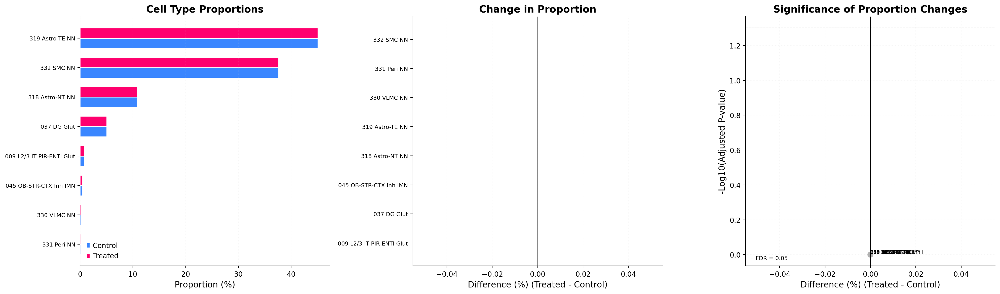

In [30]:
# Proportion comparison visualization
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# 1. Side-by-side bar chart
plot_props = ct_props[['Control', 'Treated']].sort_values('Control', ascending=True)
y_pos = range(len(plot_props))
bar_height = 0.35

axes[0].barh([y - bar_height/2 for y in y_pos], plot_props['Control'],
            bar_height, color=COLORS['control'], label='Control', edgecolor='white')
axes[0].barh([y + bar_height/2 for y in y_pos], plot_props['Treated'],
            bar_height, color=COLORS['treated'], label='Treated', edgecolor='white')
axes[0].set_yticks(y_pos)
axes[0].set_yticklabels(plot_props.index, fontsize=8)
axes[0].set_xlabel('Proportion (%)')
axes[0].set_title('Cell Type Proportions', fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.15, axis='x', linestyle=':')

# 2. Difference plot
diff_sorted = ct_props['Difference'].sort_values()
colors_diff = [COLORS['upregulated'] if x > 0 else COLORS['downregulated'] for x in diff_sorted]

axes[1].barh(range(len(diff_sorted)), diff_sorted, color=colors_diff,
            edgecolor='white', linewidth=1)
axes[1].set_yticks(range(len(diff_sorted)))
axes[1].set_yticklabels(diff_sorted.index, fontsize=8)
axes[1].axvline(x=0, color='black', linewidth=1)
axes[1].set_xlabel('Difference (%) (Treated - Control)')
axes[1].set_title('Change in Proportion', fontweight='bold')
axes[1].grid(True, alpha=0.15, axis='x', linestyle=':')

# 3. Statistical significance
fisher_df['-log10_pval'] = -np.log10(fisher_df['p_adj'] + 1e-10)
colors_vol = []
for _, row in fisher_df.iterrows():
    if row['p_adj'] < 0.05:
        colors_vol.append(COLORS['upregulated'] if row['difference'] > 0 else COLORS['downregulated'])
    else:
        colors_vol.append(COLORS['neutral'])

axes[2].scatter(fisher_df['difference'], fisher_df['-log10_pval'],
              c=colors_vol, s=80, alpha=0.8, edgecolors='white', linewidths=0.5)
axes[2].axhline(y=-np.log10(0.05), color=COLORS['dark_gray'],
              linestyle='--', linewidth=0.8, alpha=0.5, label='FDR = 0.05')
axes[2].axvline(x=0, color='black', linewidth=0.8)

for _, row in fisher_df.iterrows():
    axes[2].annotate(row['cell_type'][:20], (row['difference'], row['-log10_pval']),
                    fontsize=7, ha='left', va='bottom')

axes[2].set_xlabel('Difference (%) (Treated - Control)')
axes[2].set_ylabel('-Log10(Adjusted P-value)')
axes[2].set_title('Significance of Proportion Changes', fontweight='bold')
axes[2].legend(fontsize=8)
axes[2].grid(True, alpha=0.15, linestyle=':')

plt.tight_layout()
plt.show()

## 8. Spatial Visualization of Treatment Effects

Visualize how treatment affects gene expression in spatial context for the top DEGs across cell types.

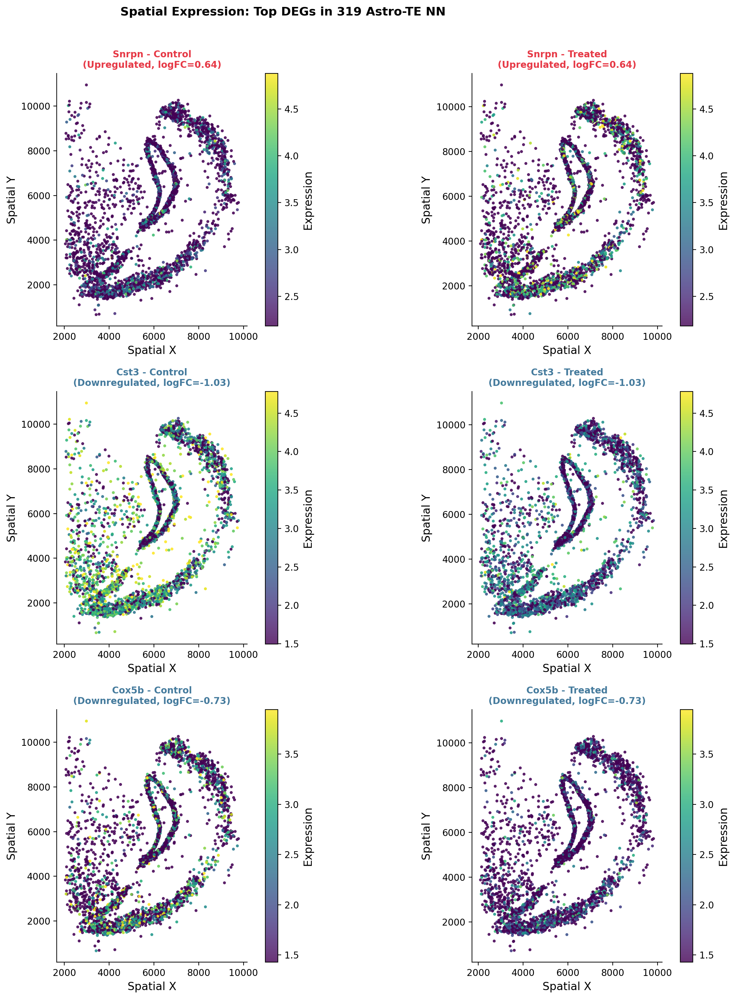

In [31]:
# Select top DEGs from the cell type with most DEGs
top_ct = deg_summary_df.iloc[0]['cell_type']
top_df = all_deg_results[top_ct]

top_up_genes = top_df[top_df['regulation'] == 'Upregulated'].nlargest(2, 'logfoldchanges')['names'].tolist()
top_down_genes = top_df[top_df['regulation'] == 'Downregulated'].nsmallest(2, 'logfoldchanges')['names'].tolist()
spatial_genes = (top_up_genes + top_down_genes)[:4]

if len(spatial_genes) > 0:
    fig, axes = plt.subplots(len(spatial_genes), 2, figsize=(14, 5 * len(spatial_genes)))
    if len(spatial_genes) == 1:
        axes = axes.reshape(1, -1)

    for row_idx, gene in enumerate(spatial_genes):
        if gene not in adata_combined.raw.var_names:
            continue

        gene_idx = adata_combined.raw.var_names.get_loc(gene)
        expr = adata_combined.raw.X[:, gene_idx]
        if issparse(expr):
            expr = expr.toarray().flatten()

        logfc = top_df[top_df['names'] == gene]['logfoldchanges'].values[0]
        reg = top_df[top_df['names'] == gene]['regulation'].values[0]
        color = COLORS['upregulated'] if reg == 'Upregulated' else COLORS['downregulated']

        # Shared colorbar range
        vmin, vmax = np.percentile(expr[expr > 0], [2, 98]) if (expr > 0).sum() > 10 else (0, 1)

        for col_idx, cond in enumerate(['Control', 'Treated']):
            mask = adata_combined.obs['condition'] == cond
            coords = adata_combined.obsm['spatial'][mask]

            sc_plot = axes[row_idx, col_idx].scatter(
                coords[:, 0], coords[:, 1],
                c=expr[mask], cmap='viridis', s=5, alpha=0.8,
                vmin=vmin, vmax=vmax)

            axes[row_idx, col_idx].set_title(
                f'{gene} - {cond}\n({reg}, logFC={logfc:.2f})',
                fontweight='bold', fontsize=10, color=color)
            axes[row_idx, col_idx].set_aspect('equal')
            axes[row_idx, col_idx].set_xlabel('Spatial X')
            axes[row_idx, col_idx].set_ylabel('Spatial Y')
            plt.colorbar(sc_plot, ax=axes[row_idx, col_idx],
                        label='Expression', fraction=0.046, pad=0.04)

    fig.suptitle(f'Spatial Expression: Top DEGs in {top_ct}', fontweight='bold', fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()

## 9. Summary and Export

In [32]:
# Summary
print("=" * 80)
print("ANALYSIS SUMMARY")
print("=" * 80)

print(f"\n1. DATA")
print(f"   Control: {adata_control.n_obs:,} spots")
print(f"   Treated: {adata_treated.n_obs:,} spots (mock)")
print(f"   Combined: {adata_combined.n_obs:,} spots, {adata_combined.n_vars:,} genes")

print(f"\n2. CELL TYPE ANNOTATION (CellTypist - Mouse_Whole_Brain.pkl)")
print(f"   Total cell types: {adata_combined.obs['majority_voting'].nunique()}")
print(f"   Top types shown: {len(cell_types_unique)}")

print(f"\n3. DIFFERENTIAL EXPRESSION (per cell type)")
for _, row in deg_summary_df.iterrows():
    print(f"   {row['cell_type']}: {row['n_up']} up, {row['n_down']} down")

print(f"\n4. GSEA (per cell type)")
for ct, df in all_gsea_results.items():
    n_sig = (df['FDR q-val'] < 0.25).sum()
    print(f"   {ct}: {n_sig} significant pathways")

print(f"\n5. PROPORTION CHANGES")
sig_props = fisher_df[fisher_df['p_adj'] < 0.05]
print(f"   Significant changes: {len(sig_props)} cell types")

print("\n" + "=" * 80)

ANALYSIS SUMMARY

1. DATA
   Control: 4,000 spots
   Treated: 4,000 spots (mock)
   Combined: 7,724 spots, 15,444 genes

2. CELL TYPE ANNOTATION (CellTypist - Mouse_Whole_Brain.pkl)
   Total cell types: 8
   Top types shown: 8

3. DIFFERENTIAL EXPRESSION (per cell type)
   319 Astro-TE NN: 1 up, 2 down
   332 SMC NN: 1 up, 2 down
   318 Astro-NT NN: 0 up, 1 down
   037 DG Glut: 1 up, 0 down

4. GSEA (per cell type)

5. PROPORTION CHANGES
   Significant changes: 0 cell types



In [33]:
# Export results
results_dir = 'integration_results/'
os.makedirs(results_dir, exist_ok=True)

# Save integrated data
output_path = 'adult_mouse_brain_ST4k_integrated.h5ad'
adata_combined.write(output_path)
print(f"Integrated data: {output_path}")

# Save DEG results per cell type
all_degs = pd.concat(all_deg_results.values(), ignore_index=True)
all_degs.to_csv(f"{results_dir}deg_per_cell_type.csv", index=False)
print(f"DEG results: {results_dir}deg_per_cell_type.csv")

# Save GSEA results
if all_gsea_results:
    all_gsea = pd.concat(all_gsea_results.values(), ignore_index=True)
    all_gsea.to_csv(f"{results_dir}gsea_per_cell_type.csv", index=False)
    print(f"GSEA results: {results_dir}gsea_per_cell_type.csv")

# Save proportions
ct_props.to_csv(f"{results_dir}cell_type_proportions.csv")
fisher_df.to_csv(f"{results_dir}proportion_tests.csv", index=False)
print(f"Proportion analysis: {results_dir}cell_type_proportions.csv")

print("\nAll results exported.")

Integrated data: adult_mouse_brain_ST4k_integrated.h5ad
DEG results: integration_results/deg_per_cell_type.csv
Proportion analysis: integration_results/cell_type_proportions.csv

All results exported.
